# **2. EDA (Exploratory Data Analysis)**


Exploratory data analysis (EDA) is a process to understand, analyze and prepare data to analyze or create models. First, how to clearly define the objectives: what is the purpose of discovering or resolving both facts? Next, do a first inspection to understand the structure of the data, types of variables and possible initial problems. We analyze each variable separately and the relationships between them to identify patterns and trends. Detect and manage null values ​​(part of this task has been carried out previously) and atypical values ​​(outliers) to avoid distortions in the analysis. All of these processes help to prepare clear and structured units, allowing us to use the predictive models that we will create later.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import pearsonr

###Load .csv with the processed dataset

In [2]:
df_cleaned = pd.read_csv("dataframe_final.csv",sep=",")
df_cleaned.describe()

,Any,Mes,Dia,Tram_Horari,Codi_Postal,Valor,temperature_2m,apparent_temperature,wind_speed_10m,sunshine_duration,direct_radiation,Dia_Setmana,Tasa interanual del IPI,dew_point_2m
count,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000,348030.000000
mean,2021.361371,6.419093,15.821625,2.499787,8021.482174,101077.228582,16.493652,15.894976,9.636141,8927.526240,132.840098,4.000132,0.068119,11.304799
std,1.646060,3.378734,8.818198,1.118508,12.118382,56626.111563,6.916633,8.696049,5.371176,9751.004453,168.621376,2.000879,10.523790,6.487438
min,2019.000000,1.000000,1.000000,1.000000,8001.000000,99.000000,-1.472500,-5.783517,0.000000,0.000000,0.000000,1.000000,-34.250000,-13.322500
25%,2020.000000,4.000000,8.000000,1.000000,8011.000000,57872.250000,11.177500,9.136863,5.804825,0.000000,0.000000,2.000000,-3.700000,6.627500
50%,2021.000000,6.000000,16.000000,2.000000,8021.000000,90795.638279,16.377500,15.410418,8.373386,0.000000,9.166667,4.000000,0.380000,11.477500
75%,2023.000000,9.000000,23.000000,4.000000,8032.000000,132299.000000,21.927502,23.278515,12.558790,20244.717000,252.333330,6.000000,2.500000,16.777500
max,2024.000000,12.000000,31.000000,4.000000,8042.000000,350933.000000,36.577500,38.466156,45.001440,21600.000000,557.833300,7.000000,54.460000,25.127500


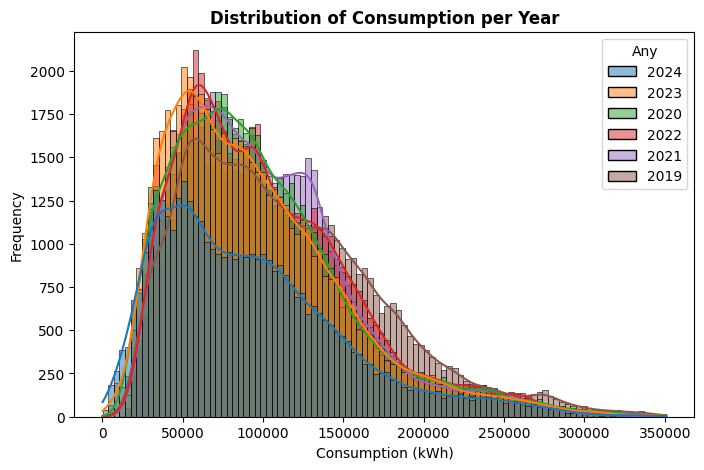

In [5]:
# Order the years based on the median of consumption (to display the lowest ones first)
ordre_anys = df_cleaned.groupby("Any")["Valor"].median().sort_values().index

# Create the histogram with the appropriate ordering for 'Any' based on consumption
plt.figure(figsize=(8,5))
sns.histplot(df_cleaned, x='Valor', hue='Any', bins=100, kde=True, palette="tab10", alpha=0.5, hue_order=ordre_anys)

# Customize the plot
plt.title("Distribution of Consumption per Year", fontsize=12, fontweight='bold')
plt.xlabel("Consumption (kWh)")
plt.ylabel("Frequency")
plt.show()

<ipython-input-7-5eef0b916b78>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


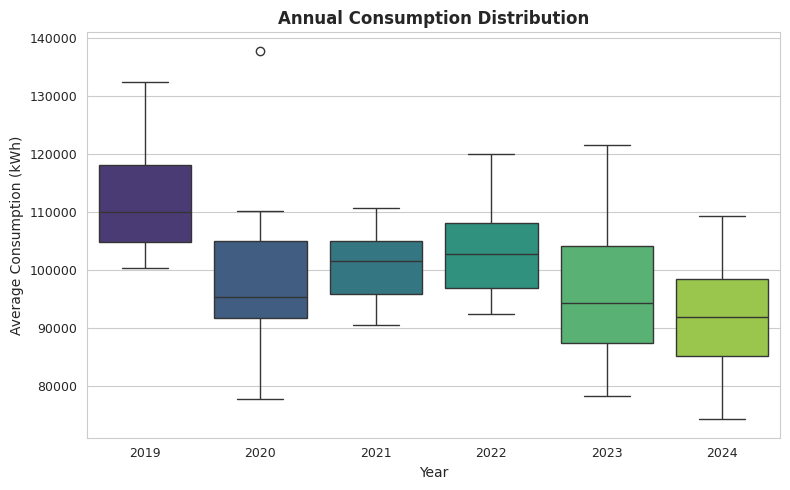

In [7]:
# Calculate the average consumption by year (Any) and month (Mes)
df_aggregat = df_cleaned.groupby(['Any', 'Mes'], sort=True).mean(numeric_only=True).reset_index()

# Set the Seaborn style to "whitegrid" for a clean and professional look
sns.set_style("whitegrid")

# Adjust the figure size to ensure readability
plt.figure(figsize=(8, 5))

# Create the boxplot with years (Any) on the x-axis and average consumption (Valor) on the y-axis
sns.boxplot(
    x='Any',  # The x-axis will represent the year
    y='Valor',  # The y-axis will represent the average consumption
    data=df_aggregat,
    palette='viridis'
)

# Add title and improved axis labels
plt.title('Annual Consumption Distribution', fontsize=12, fontweight='bold')
plt.xlabel('Year', fontsize=10)
plt.ylabel('Average Consumption (kWh)', fontsize=10)

# Customize the font size for better readability
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

# Adjust the layout to avoid label clipping and improve plot spacing
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-8-48e035c26e34>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


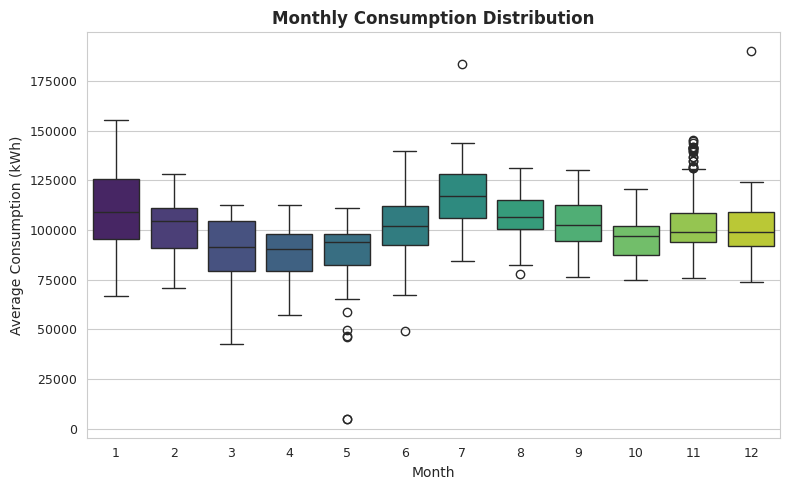

In [8]:
# Calculate the average consumption by year (Any), month (Mes), and day (Dia)
df_aggregat = df_cleaned.groupby(['Any', 'Mes', 'Dia'], sort=True).mean(numeric_only=True).reset_index()

# Set the Seaborn style to "whitegrid" for a clean and easy-to-read plot
sns.set_style("whitegrid")

# Adjust the figure size for better readability
plt.figure(figsize=(8, 5))

# Create the boxplot with months (Mes) on the x-axis and average consumption (Valor) on the y-axis
sns.boxplot(
    x='Mes',  # Month on the x-axis
    y='Valor',  # Adjust if needed based on your actual column name for consumption
    data=df_aggregat,
    palette='viridis'
)

# Add title and improved axis labels
plt.title('Monthly Consumption Distribution', fontsize=12, fontweight='bold')
plt.xlabel('Month', fontsize=10)
plt.ylabel('Average Consumption (kWh)', fontsize=10)

# Customize tick font sizes for better legibility
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

# Adjust the layout for a clean look
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-9-36569761abf5>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


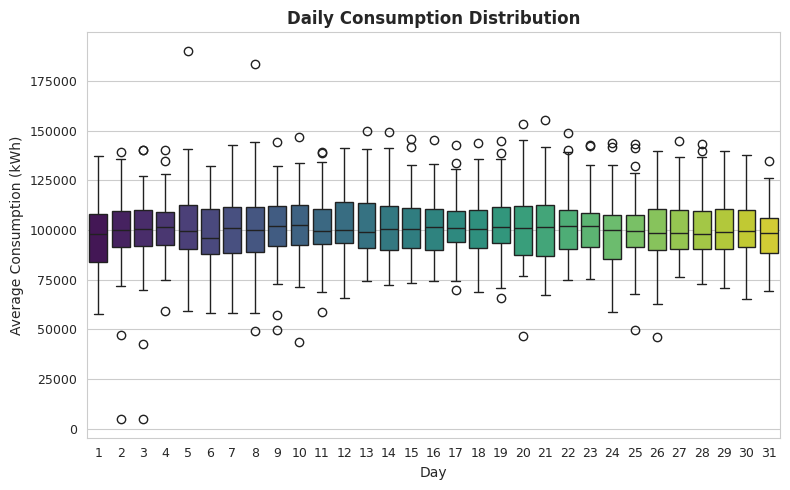

In [9]:
# Calculate the average consumption by year (Any), month (Mes), and day (Dia)
df_aggregat = df_cleaned.groupby(['Any', 'Mes', 'Dia'], sort=False).mean(numeric_only=True).reset_index()

# Set the Seaborn style to "whitegrid" for a clean and easy-to-read plot
sns.set_style("whitegrid")

# Adjust the figure size for better readability
plt.figure(figsize=(8, 5))

# Create the boxplot with days (Dia) on the x-axis and average consumption (Valor) on the y-axis
sns.boxplot(
    x='Dia',  # Days on the x-axis
    y='Valor',  # Adjust if needed based on your actual column name for consumption
    data=df_aggregat,
    palette='viridis',
    order=range(1, 32)  # Explicitly order the days from 1 to 31
)

# Add title and improved axis labels
plt.title('Daily Consumption Distribution', fontsize=12, fontweight='bold')
plt.xlabel('Day', fontsize=10)
plt.ylabel('Average Consumption (kWh)', fontsize=10)

# Customize tick font sizes for better legibility
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

# Adjust the layout for a clean look
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-10-a6d5a4e1d25d>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


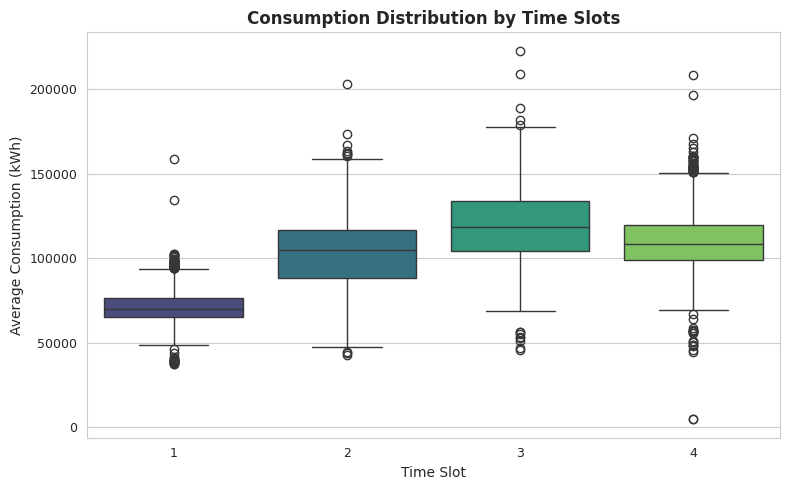

In [10]:
# Group by the different columns and calculate the mean of numeric columns
df_aggregat = df_cleaned.groupby(["Tram_Horari", "Any", "Mes", "Dia"], sort=True).mean(numeric_only=False).reset_index()

# Set the Seaborn style to "whitegrid" for a clean background
sns.set_style("whitegrid")

# Adjust the figure size for better readability
plt.figure(figsize=(8, 5))

# Create the boxplot, using Tram_Horari on the x-axis and average consumption (Valor) on the y-axis
sns.boxplot(
    x='Tram_Horari',  # Time slot (Tram_Horari) on the x-axis
    y='Valor',  # Ensure 'Valor' corresponds to your consumption column
    data=df_aggregat,
    palette='viridis'
)

# Add title and improved axis labels
plt.title('Consumption Distribution by Time Slots', fontsize=12, fontweight='bold')
plt.xlabel('Time Slot', fontsize=10)
plt.ylabel('Average Consumption (kWh)', fontsize=10)

# Customize tick font sizes for better readability
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

# Adjust layout to prevent clipping of labels and improve plot spacing
plt.tight_layout()

# Show the plot
plt.show()

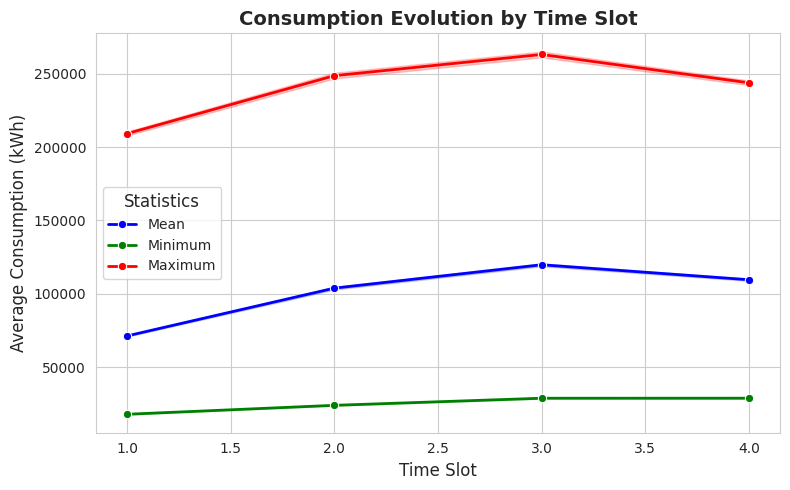

In [11]:
# Group by the different columns and calculate mean, min, and max for 'Valor'
df_aggregat = df_cleaned.groupby(["Tram_Horari", "Any", "Mes", "Dia"], sort=True).agg(
    {'Valor': ['mean', 'min', 'max']}
).reset_index()

# Set the Seaborn style to "whitegrid" for a clean background
sns.set_style("whitegrid")

# Adjust the figure size for better readability
plt.figure(figsize=(8, 5))

# Plot the mean line
sns.lineplot(
    x='Tram_Horari',
    y=('Valor', 'mean'),
    data=df_aggregat,
    label='Mean',
    marker='o',
    linewidth=2,
    color='blue'
)

# Plot the min line
sns.lineplot(
    x='Tram_Horari',
    y=('Valor', 'min'),
    data=df_aggregat,
    label='Minimum',
    marker='o',
    linewidth=2,
    color='green'
)

# Plot the max line
sns.lineplot(
    x='Tram_Horari',
    y=('Valor', 'max'),
    data=df_aggregat,
    label='Maximum',
    marker='o',
    linewidth=2,
    color='red'
)

# Add title and labels in English
plt.title('Consumption Evolution by Time Slot', fontsize=14, fontweight='bold')
plt.xlabel('Time Slot', fontsize=12)
plt.ylabel('Average Consumption (kWh)', fontsize=12)

# Customize tick font sizes for better readability
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Add legend with customized font size
plt.legend(title='Statistics', title_fontsize=12, fontsize=10)

# Adjust layout for a clean look
plt.tight_layout()

# Show the plot
plt.show()

<ipython-input-12-25df760b7045>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Codi_Postal", y="Valor", data=df_aggregat, palette="viridis")


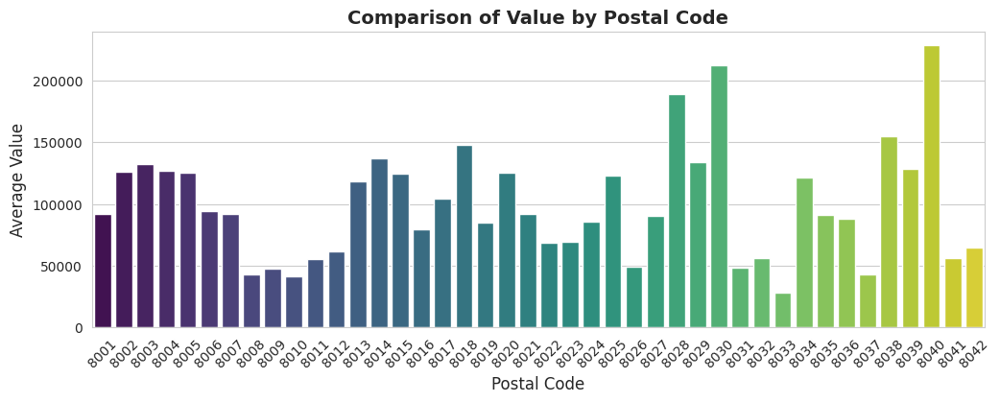

In [12]:
# Group the data by postal code and calculate the median
df_aggregat = df_cleaned.groupby("Codi_Postal", sort=False).median(numeric_only=True).reset_index()

# Adjust the figure size for better readability
plt.figure(figsize=(12, 4))

# Create the bar chart
sns.barplot(x="Codi_Postal", y="Valor", data=df_aggregat, palette="viridis")

# Add title and labels in English
plt.title("Comparison of Value by Postal Code", fontsize=14, fontweight="bold")
plt.xlabel("Postal Code", fontsize=12)
plt.ylabel("Average Value", fontsize=12)
plt.xticks(rotation=45)  # Rotate the labels if needed

# Show the plot
plt.show()

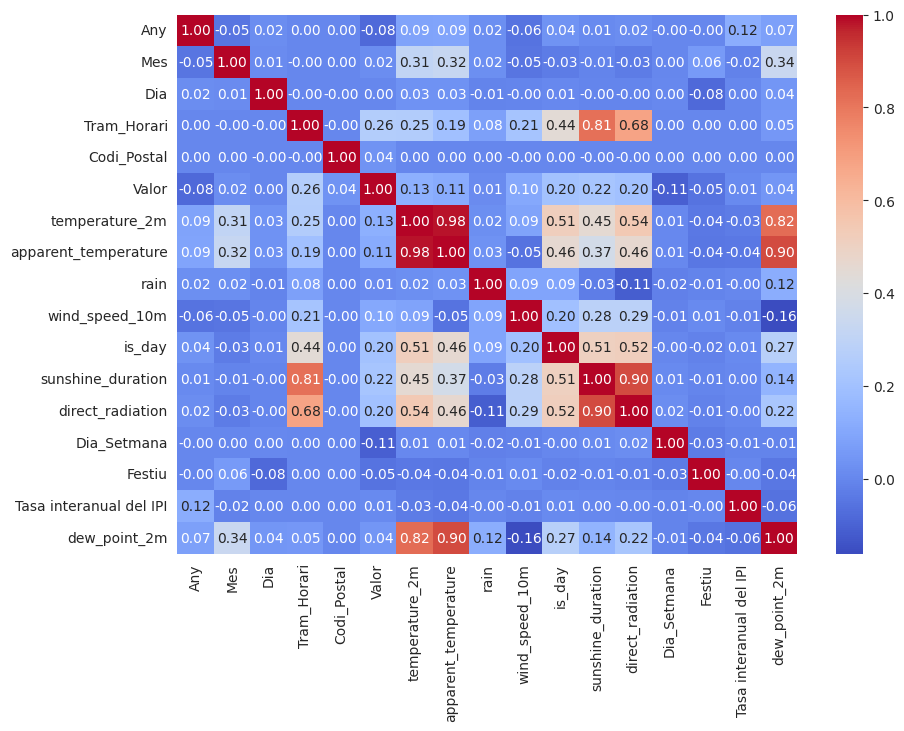

In [13]:
corr = df_cleaned.corr()
plt.figure(figsize=(10, 7))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

Next, we will compare distance correlations (DCOR) with other traditional correlation methods such as Pearson and Spearman, on our dataset.

**Pearson Correlation:** Measures the linear relationship between two variables. It is suitable when there is a clear and direct relationship, such as a straight line, between the variables.

**Spearman Correlation:** Measures the monotonic relationship (i.e., when both variables move in the same direction, but not necessarily in a linear manner). It can detect non-linear relationships that are monotonic, such as upward or downward curves.

**Distance Correlation **(DCOR): Unlike Pearson and Spearman, distance correlation measures the entire dependency between two variables, whether linear or non-linear. It is more flexible and can detect any type of relationship between variables, such as curves, oscillations, or other complex relationships.



In [15]:
!pip install dcor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 1.9 MB/s eta 0:00:00


/usr/local/lib/python3.11/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(int64, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/dcor/_dcor_internals.py:188: RuntimeWarning: overflow encountered in scalar multiply
  third_term = a_total_sum * b_total_sum / n_samples
/usr/local/lib/python3.11/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(bool, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


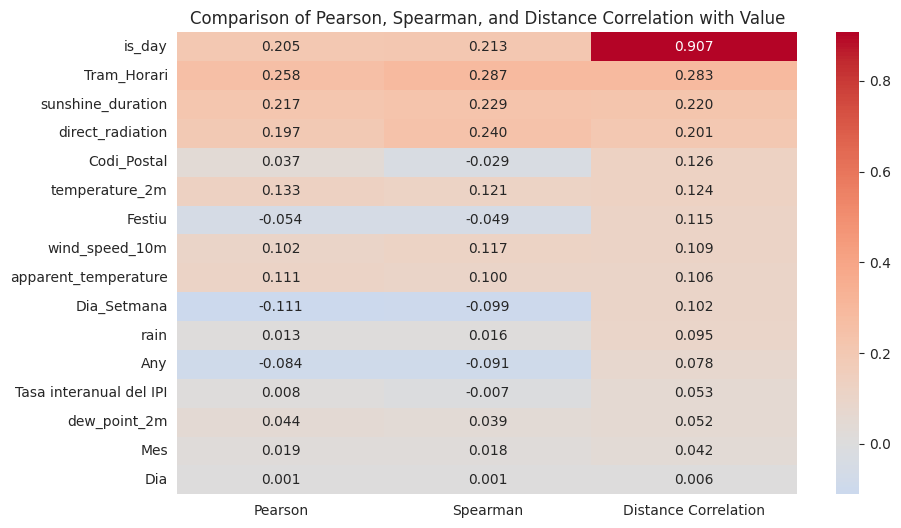

In [16]:
import dcor

# Pearson and Spearman correlations
pearson_corr = df_cleaned.corr(method="pearson")["Valor"].drop("Valor")
spearman_corr = df_cleaned.corr(method="spearman")["Valor"].drop("Valor")

# Distance Correlation
distance_corr = {col: dcor.distance_correlation(df_cleaned["Valor"], df_cleaned[col]) for col in df_cleaned.columns if col != "Valor"}
distance_corr = pd.Series(distance_corr)

# Combine the results into a DataFrame
df_corr = pd.DataFrame({
    "Pearson": pearson_corr,
    "Spearman": spearman_corr,
    "Distance Correlation": distance_corr
}).sort_values(by="Distance Correlation", ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.heatmap(df_corr, annot=True, cmap="coolwarm", center=0, fmt=".3f")
plt.title("Comparison of Pearson, Spearman, and Distance Correlation with Value")
plt.show()


We will explore the data, its importance, and how the variables relate to each other.

In [ ]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 56.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=3b3caa81d348c27c12593bde6c8a3e3a540667ad8dc6a2256d230c4ebb5b5a59
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df_cleaned)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Correlació entre les diferents variables